In [3]:
import numpy as np
import mne
import matplotlib.pyplot as plt
from datetime import datetime

0.10345207 13.168933


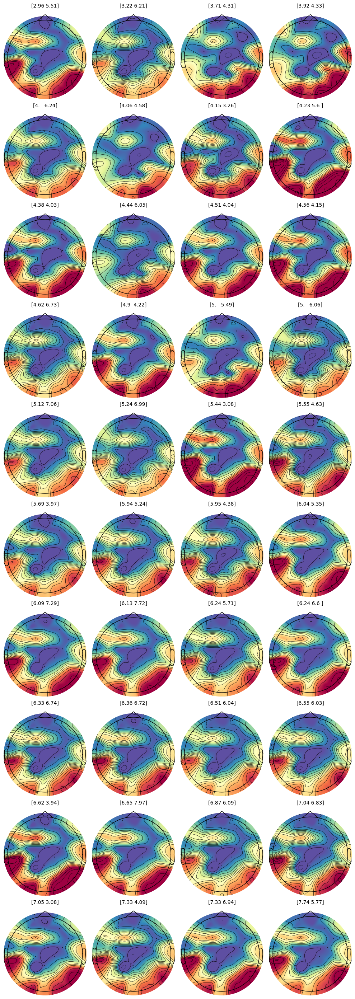

In [48]:
s = 's18'
biosemi_montage = mne.channels.make_standard_montage('standard_1020')
ch_names = ['Fp1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 
            'CP5','P7', 'P3', 'Pz', 'PO3', 'O1', 'Oz', 'O2', 'PO4', 
            'P4', 'P8','CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 
            'F8', 'AF4', 'Fp2','Fz', 'Cz']
fig, axes = plt.subplots(figsize=(10, 28), nrows=10, ncols=4)
label = np.load(f'./Topo_data/{s}-labels.npy')
label = np.around(label, decimals=2)
unique_rows, indices = np.unique(label[:,0:2], axis=0, return_index=True)

all_data = [np.load(f'Topo_data/{s}-{l}.npy') for l in unique_rows]
all_data_means = [np.mean(data, axis=1) for data in all_data]
vmin = min([data.min() for data in all_data_means])
vmax = max([data.max() for data in all_data_means])
print(vmin, vmax)

for index, l in enumerate(unique_rows):
    data = np.load(f'Topo_data/{s}-{l}.npy')
    info = mne.create_info(ch_names=ch_names, sfreq=128., ch_types='eeg')
    evoked = mne.EvokedArray(data, info)
    evoked.set_montage(biosemi_montage)
    ax=axes[index//4, index%4]
    mne.viz.plot_topomap(np.mean(evoked.data, axis=1), evoked.info, show=False, axes=ax,
                     ch_type='eeg', cmap='Spectral_r', contours=15, vlim=(vmin, vmax),)#vlim=(vmin, vmax),
    ax.set_title(f'{l}', fontsize=10)

fig.tight_layout()
current = datetime.now()
time = current.strftime("%H-%M")
plt.savefig(f'allLabel_{s}_.pdf')

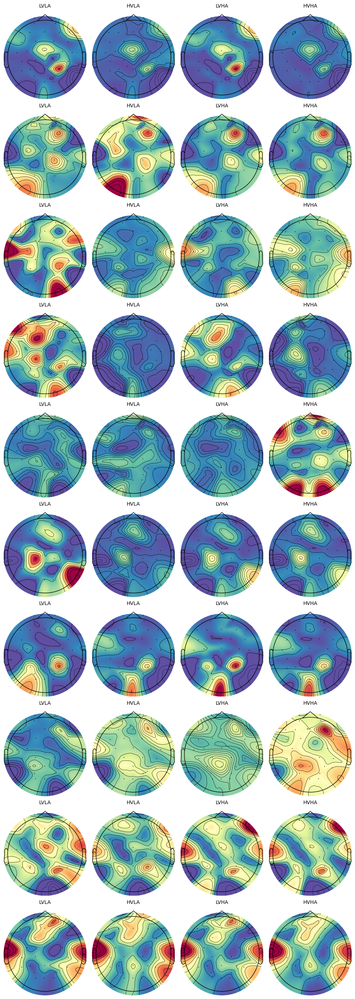

In [19]:
subjects = ['01', '03','04','06','07','09','10','13','16','18']

biosemi_montage = mne.channels.make_standard_montage('standard_1020')
ch_names = ['Fp1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 
            'CP5','P7', 'P3', 'Pz', 'PO3', 'O1', 'Oz', 'O2', 'PO4', 
            'P4', 'P8','CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 
            'F8', 'AF4', 'Fp2','Fz', 'Cz']
fig, axes = plt.subplots(figsize=(10, 28), nrows=len(subjects), ncols=4)
classes = ['LVLA', 'HVLA','LVHA','HVHA']
for index, subject in enumerate(subjects):
    all_data = [np.load(f'Topo_data/s{subject}-{classes[classe]}.npy') for classe in range(4)]
    all_data_means = [np.mean(data, axis=1) for data in all_data]
    vmin = min([data.min() for data in all_data_means])
    vmax = max([data.max() for data in all_data_means])

    for classe in range(4):
        data = np.load(f'Topo_data/s{subject}-{classes[classe]}.npy')
        info = mne.create_info(ch_names=ch_names, sfreq=128., ch_types='eeg')
        evoked = mne.EvokedArray(data, info)
        evoked.set_montage(biosemi_montage)
        ax=axes[index, classe]
        mne.viz.plot_topomap(np.mean(evoked.data, axis=1), evoked.info, show=False, axes=ax,
                         ch_type='eeg', cmap='Spectral_r', contours=10, vlim=(vmin, vmax),)#vlim=(vmin, vmax),
        ax.set_title(f'{classes[classe]}', fontsize=10)

fig.tight_layout()
current = datetime.now()
time = current.strftime("%H-%M")
plt.savefig(f'vlim{time}.pdf')

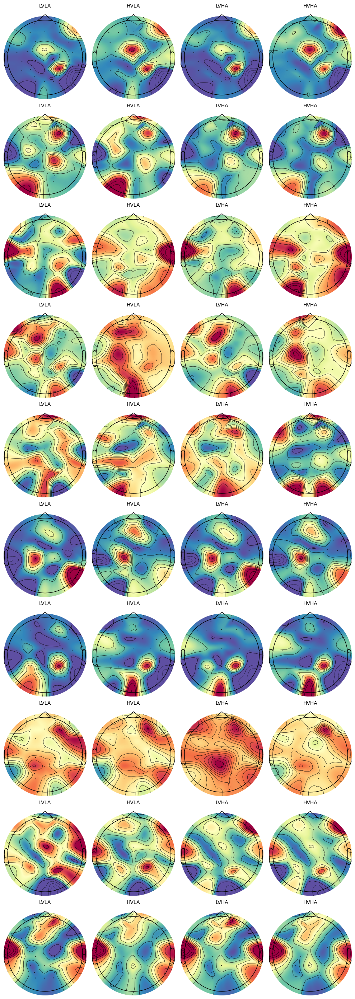

In [14]:
subjects = ['01', '03','04','06','07','09','10','13','16','18']

biosemi_montage = mne.channels.make_standard_montage('standard_1020')
ch_names = ['Fp1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 
            'CP5','P7', 'P3', 'Pz', 'PO3', 'O1', 'Oz', 'O2', 'PO4', 
            'P4', 'P8','CP6', 'CP2', 'C4', 'T8', 'FC6', 'FC2', 'F4', 
            'F8', 'AF4', 'Fp2','Fz', 'Cz']
fig, axes = plt.subplots(figsize=(10, 28), nrows=len(subjects), ncols=4)
classes = ['LVLA', 'HVLA','LVHA','HVHA']
for index, subject in enumerate(subjects):
    all_data = [np.load(f'Topo_data/s{subject}-{classes[classe]}.npy') for classe in range(4)]
    all_data_means = [np.mean(data, axis=1) for data in all_data]
    vmin = min([data.min() for data in all_data_means])
    vmax = max([data.max() for data in all_data_means])

    for classe in range(4):
        data = np.load(f'Topo_data/s{subject}-{classes[classe]}.npy')
        info = mne.create_info(ch_names=ch_names, sfreq=128., ch_types='eeg')
        evoked = mne.EvokedArray(data, info)
        evoked.set_montage(biosemi_montage)
        ax=axes[index, classe]
        mne.viz.plot_topomap(np.mean(evoked.data, axis=1), evoked.info, show=False, axes=ax,
                         ch_type='eeg', cmap='Spectral_r', contours=10,)#vlim=(vmin, vmax),
        ax.set_title(f'{classes[classe]}', fontsize=10)

fig.tight_layout()
plt.show()

LV的图和HV的图分布不一样, 同是LV的图与同时HV的图非常相像。与之对比，地位一样的LA和HA的分布却没有这么像，说明在连接特征的层面愉悦度的影响高于效价
理论：大脑面对负情绪时更加活跃：在控制Arousal时基本可以验证。
cf. EEG Functional Connectivity Underlying Emotional Valance and Arousal Using Minimum Spanning Trees
控制LA，LV和HV的差别比较大，